# NDVI Sentinel-2 Analysis Notebook 

## Environment

In [12]:
# 実行場所の設定
%cd /workspace

/workspace


In [111]:
!pip install -q awscli opencv-python pandas scikit-learn seaborn lightgbm

## Sentinel-2 Data

In [ ]:
# データ取得
!aws s3  cp --request-payer=requester s3://sentinel-s2-l2a/tiles/54/S/TE/2023/5/2/0/R10m/ ./sentinel-2/5_2/ --recursive
!aws s3  cp --request-payer=requester s3://sentinel-s2-l2a/tiles/53/S/QV/2023/5/7/0/R10m/ ./sentinel-2/5_7/ --recursive

## Import 

In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from sklearn.linear_model import LinearRegression
import seaborn as sns
import lightgbm as lgb

## NDVI 

In [13]:
PATH_5_2_B4 = './sentinel-2/5_2/B04.jp2'
PATH_5_2_B8 = './sentinel-2/5_2/B08.jp2'

img_b4 = cv2.imread(PATH_5_2_B4, cv2.IMREAD_ANYDEPTH)
img_b8 = cv2.imread(PATH_5_2_B8, cv2.IMREAD_ANYDEPTH)

img_b4.shape, img_b4.dtype

((10980, 10980), dtype('uint16'))

In [15]:
# 型の変換
img_b4 = img_b4.astype(np.float32)
img_b8 = img_b8.astype(np.float32)

In [17]:
# NaNの値を0に変換
img_b4[img_b4 == np.nan] = 0.
img_b8[img_b8 == np.nan] = 0.

# 非負値に変換
img_b8[img_b8 < 1.] = 1.

In [18]:
ndvi = (img_b8 - img_b4) / (img_b8 + img_b4)

## 可視化

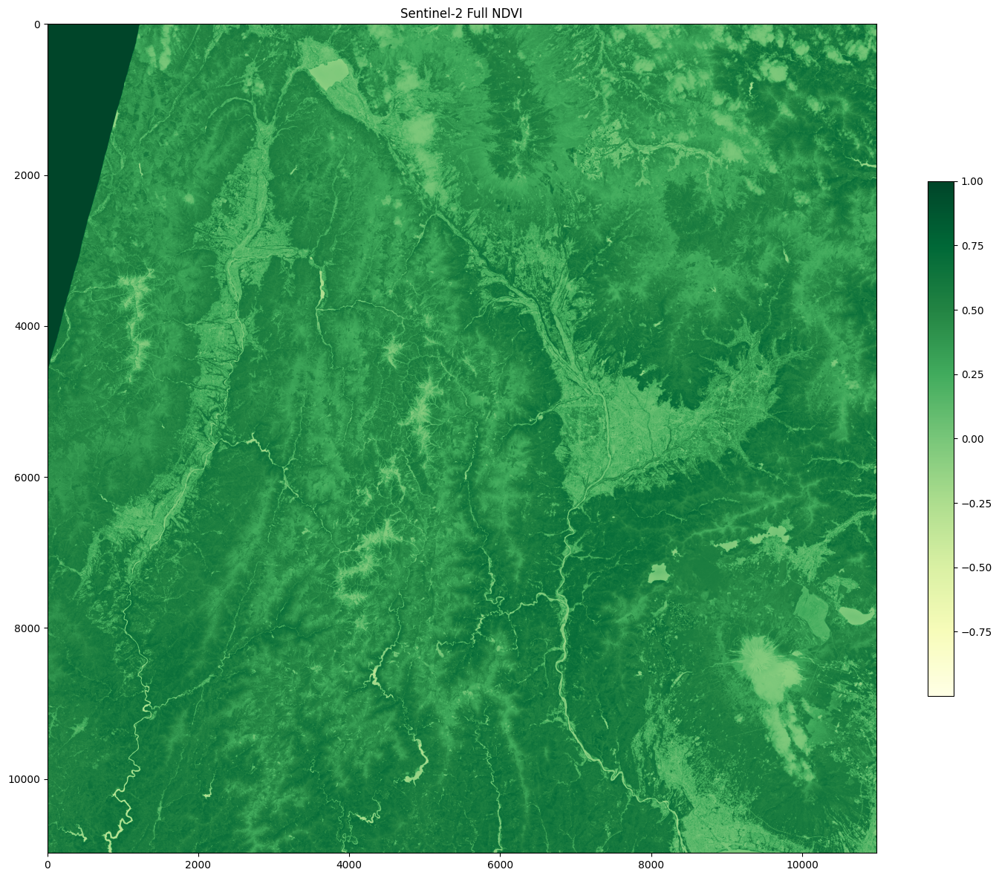

In [56]:
plt.figure(figsize=(18, 18))
plt.title('Sentinel-2 Full NDVI')
plt.imshow(ndvi, cmap='YlGn')
plt.colorbar(shrink=0.5)
plt.savefig('output/sentinel-2_full_ndvi.png')
plt.show();
plt.clf()
plt.close()

## 分布

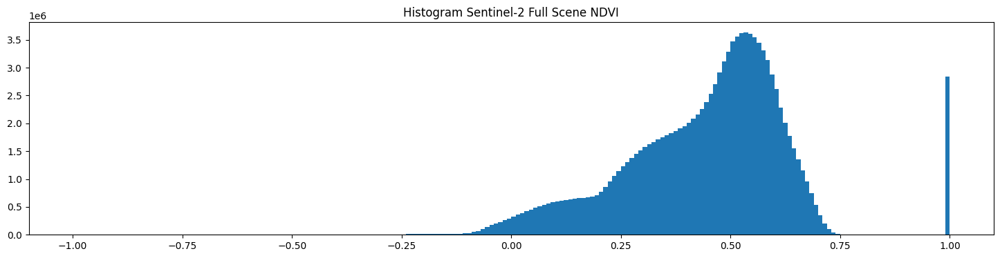

In [49]:
plt.figure(figsize=(18, 4))
plt.title('Histogram Sentinel-2 Full Scene NDVI')
plt.hist(ndvi.ravel(), bins=200, range=(-1, 1))
plt.savefig('output/sentinel-2_hist_scene_ndvi.png')
plt.show();
plt.clf()
plt.close()

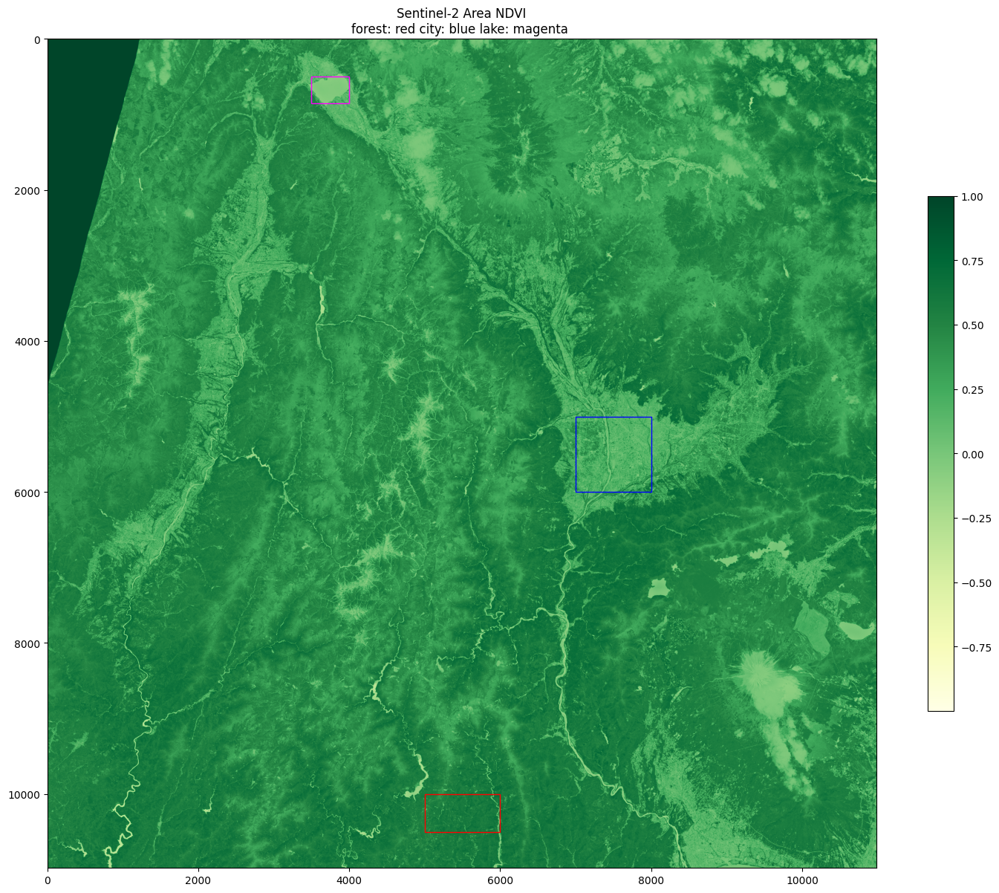

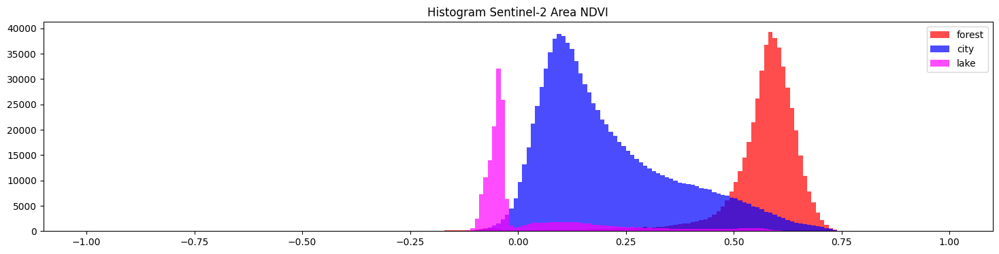

In [58]:
bboxes = [
    ((5000, 10000), (6000, 10500)),
    ((7000, 5000),  (8000, 6000) ),
    ((3500, 500),   (4000, 850) ),
    ]
names = ['forest', 'city', 'lake']
colors = ['red', 'blue', 'magenta']

title_usage_guide = "".join([f'{n}: {c} ' for n, c in zip(names, colors)])

plt.figure(figsize=(18, 18))
ax = plt.axes()
ax.set_title(f'Sentinel-2 Area NDVI\n{title_usage_guide}')
plt.imshow(ndvi, cmap='YlGn')

for i, (bbox, name, color) in enumerate(zip(bboxes, names, colors)):
    p = patches.Rectangle(xy=(
        bbox[0][0], bbox[0][1]
        ), 
            width=bbox[1][0] - bbox[0][0], 
            height=bbox[1][1] - bbox[0][1]
            , color=color, fill=False)
    ax.add_patch(p)

plt.colorbar(shrink=0.5)
plt.savefig('output/sentinel-2_area_ndvi.png')
plt.show();
plt.clf()
plt.close()

plt.figure(figsize=(18, 4))
plt.title('Histogram Sentinel-2 Area NDVI')
for i, (bbox, name, color) in enumerate(zip(bboxes, names, colors)):
    plt.hist(ndvi[
        bbox[0][1]:bbox[1][1], bbox[0][0]:bbox[1][0]
        ].ravel(), 
             bins=200, range=(-1, 1), 
             label=name, color=color,
             alpha=0.7)
plt.legend()
plt.savefig('output/sentinel-2_hist_area_ndvi.png')
plt.show();
plt.clf()
plt.close()

## フィルター

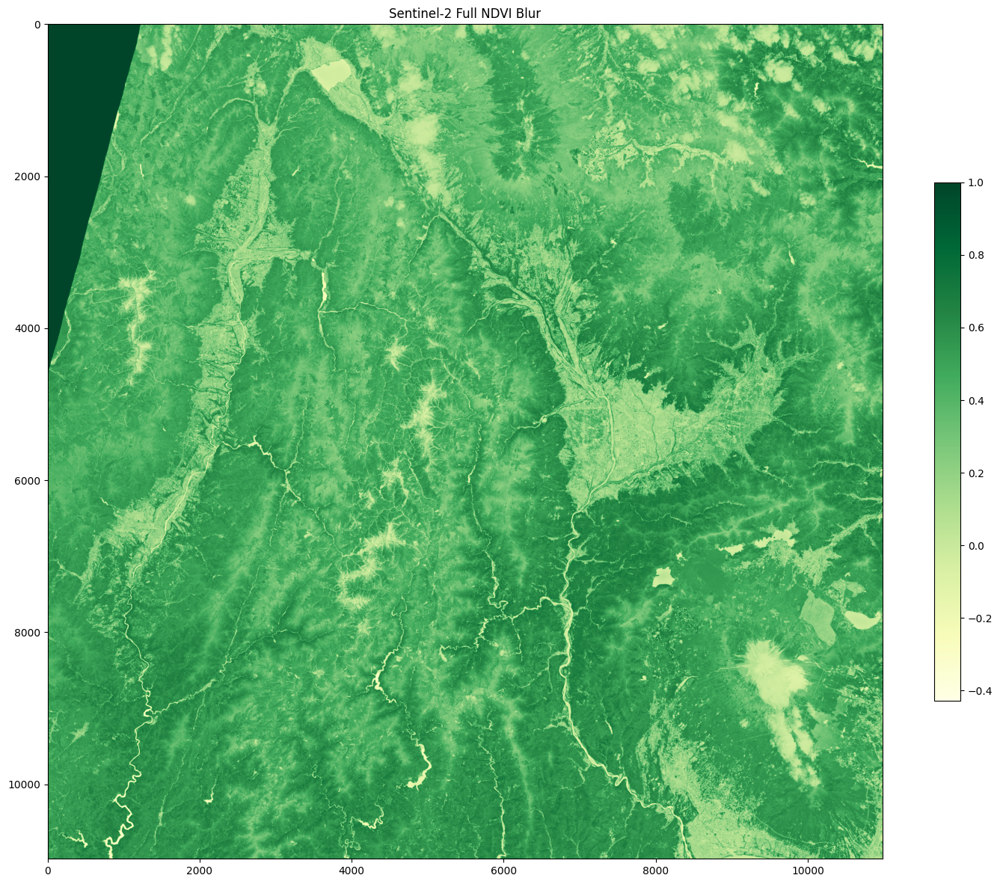

In [59]:
# 平滑化
K = 5 # カーネルサイズ
ndvi_blur = cv2.blur(ndvi, (K, K))

plt.figure(figsize=(18, 18))
plt.title('Sentinel-2 Full NDVI Blur')
plt.imshow(ndvi_blur, cmap='YlGn')
plt.colorbar(shrink=0.5)
plt.savefig('output/sentinel-2_full_ndvi_blur.png')
plt.show();
plt.clf()
plt.close()

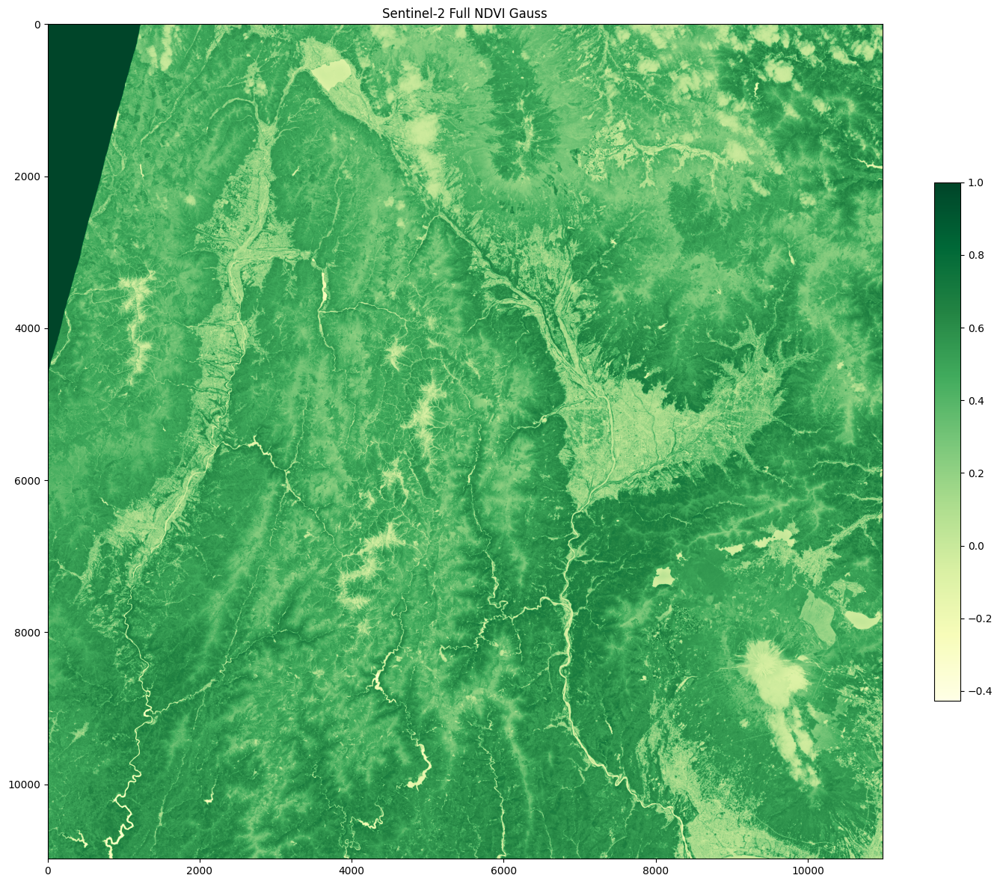

In [60]:
# ガウシアンフィルタ
K = 5 # カーネルサイズ
ndvi_gauss = cv2.GaussianBlur(ndvi, (K, K), K)

plt.figure(figsize=(18, 18))
plt.title('Sentinel-2 Full NDVI Gauss')
plt.imshow(ndvi_gauss, cmap='YlGn')
plt.colorbar(shrink=0.5)
plt.savefig('output/sentinel-2_full_ndvi_gauss.png')
plt.show();
plt.clf()
plt.close()

## 季節変化

In [80]:
df_year_dummy = pd.DataFrame({
    'date': [
        f'2022-{str(i+1).zfill(2)}-01 10:00'
        for i in range(12)
        ],
    'ndvi': [
        0.1, 0.1, 0.2, 0.25, 0.3, 0.5, 0.525, 0.625, 0.6, 0.575, 0.2, 0.1,    
        ],
    })

df_year_dummy['date'] = pd.to_datetime(df_year_dummy['date'])
df_year_dummy.set_index('date')
df_year_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    12 non-null     datetime64[ns]
 1   ndvi    12 non-null     float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 320.0 bytes


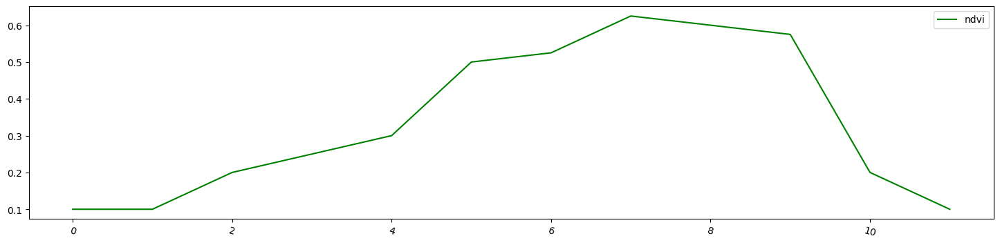

In [81]:
plt.figure(figsize=(18, 4))
df_year_dummy['ndvi'].plot(rot=-15, label='ndvi', color='green')
plt.legend()
plt.savefig('output/ndvi_year_dummy.png')
plt.show();
plt.clf()
plt.close()

## モデリング

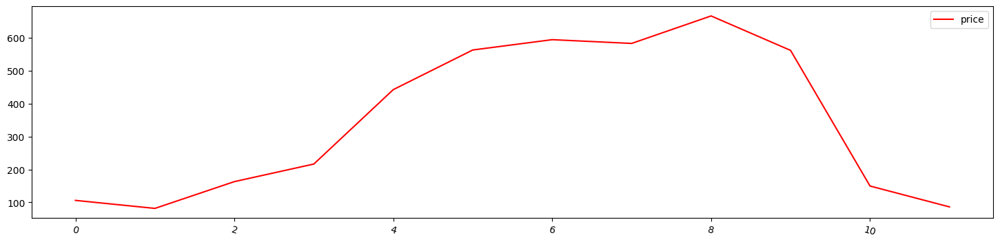

In [86]:
ratio = 0.1
df_year_dummy['price'] = (
    df_year_dummy['ndvi'].values * np.random.normal(1, 0.15, size=len(df_year_dummy)) * ratio
    ) * 1E4

plt.figure(figsize=(18, 4))
df_year_dummy['price'].plot(rot=-15, label='price', color='red')
plt.legend()
plt.savefig('output/price_year_dummy.png')
plt.show();
plt.clf()
plt.close()

#### 相関分析

<Figure size 800x800 with 0 Axes>

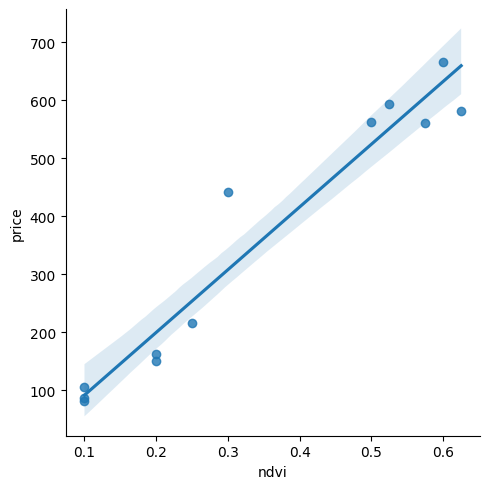

In [105]:
plt.figure(figsize=(8, 8))
g = sns.lmplot(
    data=df_year_dummy, x="ndvi", y="price",
    
    height=5
)
plt.savefig('output/scatter_ndvi-price.png')
plt.show();
plt.clf()
plt.close()

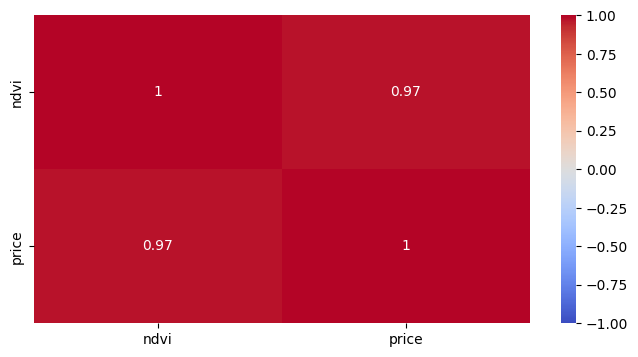

In [96]:
df_cor = df_year_dummy[['ndvi', 'price']].corr()

plt.figure(figsize=(8, 4))
sns.heatmap(df_cor, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
plt.savefig('output/heatmap_ndvi-price.png')
plt.show();
plt.clf()
plt.close()

In [101]:
model = LinearRegression()

# 学習
model.fit(df_year_dummy[['ndvi']], df_year_dummy['price'])

# 予測
df_year_dummy['predict'] = model.predict(df_year_dummy[['ndvi']])

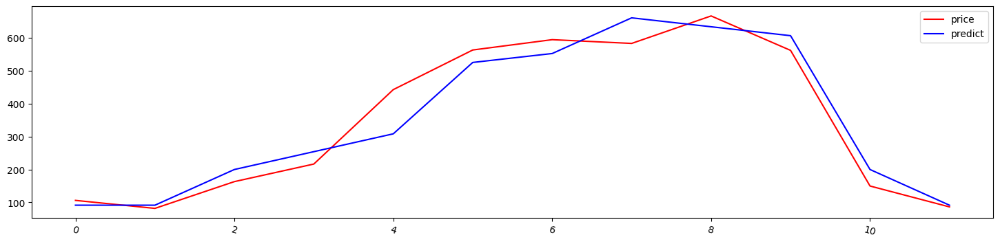

In [102]:
plt.figure(figsize=(18, 4))
df_year_dummy['price'].plot(rot=-15, label='price', color='red')
df_year_dummy['predict'].plot(rot=-15, label='predict', color='blue')
plt.legend()
plt.savefig('output/predict_price.png')
plt.show();
plt.clf()
plt.close()

In [107]:
df_year_dummy['diff'] = abs(df_year_dummy['price'] - df_year_dummy['predict'])
df_year_dummy['diff'].mean()

43.55001886633696

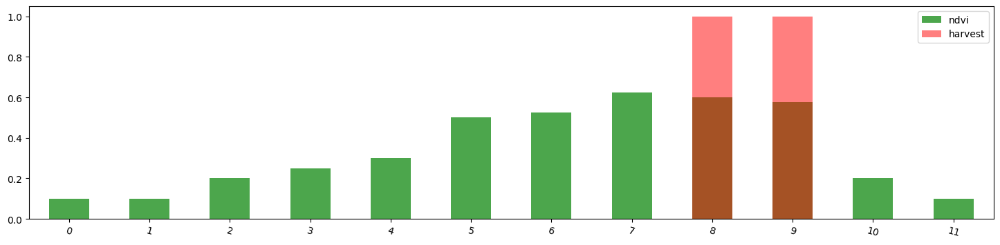

In [117]:
df_year_dummy['harvest'] = [0] * 8 + [1] * 2 + [0] * 2

plt.figure(figsize=(18, 4))
df_year_dummy['ndvi'].plot(kind='bar', rot=-15, label='ndvi', color='green', alpha=0.7)
df_year_dummy['harvest'].plot(kind='bar', rot=-15, label='harvest', color='red', alpha=0.5)
plt.legend()
plt.savefig('output/bar_ndvi-harvest.png')
plt.show();
plt.clf()
plt.close()

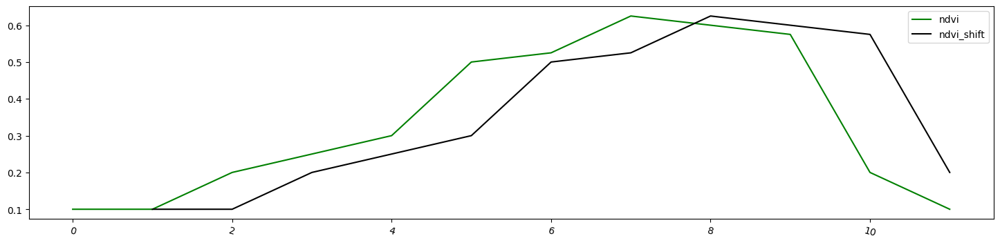

In [113]:
df_year_dummy['ndvi_shift'] = df_year_dummy['ndvi'].shift(1)

plt.figure(figsize=(18, 4))
df_year_dummy['ndvi'].plot(rot=-15, label='ndvi', color='green')
df_year_dummy['ndvi_shift'].plot(rot=-15, label='ndvi_shift', color='black')
plt.legend()
plt.savefig('output/ndvi_shift.png')
plt.show();
plt.clf()
plt.close()

In [148]:
params = {
    'objective': 'binary',
    'metric': 'auc',
    'verbosity': 0,
    'num_leaves': 2, 
    'max_depth': 1,
    'min_data': 1,
    'force_col_wise': True,
}
lgb_train = lgb.Dataset(df_year_dummy[['ndvi', 'ndvi_shift']], df_year_dummy['harvest'])

# 学習
model = lgb.train(params, lgb_train,
                  num_boost_round=20,
                 )

# 予測
df_year_dummy['predict_harvest'] = model.predict(df_year_dummy[['ndvi', 'ndvi_shift']])

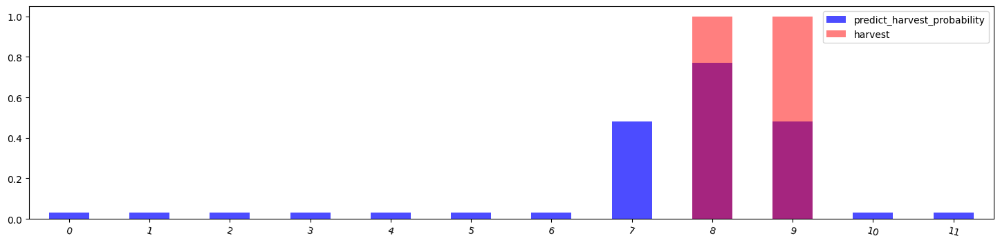

In [155]:
plt.figure(figsize=(18, 4))
df_year_dummy['predict_harvest'].plot(kind='bar', rot=-15, label='predict_harvest_probability', color='blue', alpha=0.7)
df_year_dummy['harvest'].plot(kind='bar', rot=-15, label='harvest', color='red', alpha=0.5)
plt.legend()
plt.savefig('output/bar_predict_ndvi-harvest.png')
plt.show();
plt.clf()
plt.close()

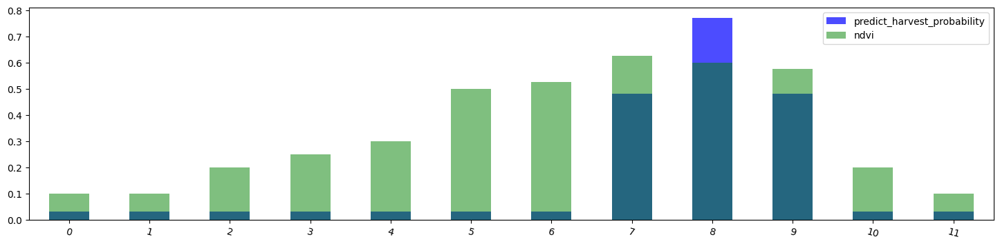

In [154]:
plt.figure(figsize=(18, 4))
df_year_dummy['predict_harvest'].plot(kind='bar', rot=-15, label='predict_harvest_probability', color='blue', alpha=0.7)
df_year_dummy['ndvi'].plot(kind='bar', rot=-15, label='ndvi', color='green', alpha=0.5)
plt.legend()
plt.savefig('output/bar_predict_ndvi-harvest-ndvi.png')
plt.show();
plt.clf()
plt.close()